In [249]:
import numpy as np
import read_segy
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

#for font in fm.fontManager.ttflist: # 查看可用字体
#    print(font.name)
matplotlib.rcParams['font.family'] = ['Times New Roman', 'SimHei']
matplotlib.rcParams['axes.unicode_minus'] = False

'''
matplotlib.rcParams['font.sans-serif'] = ['SimHei']     # 中文字体（黑体）
matplotlib.rcParams['font.family'] = 'sans-serif'       # 设置默认字体族
matplotlib.rcParams['axes.unicode_minus'] = False       # 解决负号显示问题
matplotlib.rcParams['font.serif'] = ['Times New Roman']           # 英文字体（Arial or Times New Roman）
#matplotlib.rcParams['font.family'] = 'Times New Roman'
'''

def plot_wiggle(ax, data, title, selected_traces, trace_spacing, scale=50):
    """
    绘制地震波形图（Wiggle Plot）
    
    参数:
        ax: matplotlib的Axes对象
        data: 地震数据（形状为 [时间采样点, 道数]）
        title: 图名
        selected_traces: 选择要显示的道（如 range(0, 128, 3)）
        trace_spacing: 道间距（水平偏移量）
        scale: 波形幅度缩放因子（默认50）
    """
    num_samples, num_traces = data.shape
    max_trace = max(selected_traces) if selected_traces else num_traces - 1
    max_offset = (max_trace + 1) * trace_spacing  # 动态计算最大偏移
    
    for trace_idx in selected_traces:
        trace = data[:, trace_idx]
        trace_normalized = scale * trace / np.max(np.abs(trace)) if np.max(np.abs(trace)) != 0 else trace
        offset = trace_idx * trace_spacing
        
        if np.all(trace == 0):
            ax.plot([offset, offset], [0, num_samples], color='black', linewidth=0.5)
        else:
            ax.plot(trace_normalized + offset, np.arange(num_samples), color='black', linewidth=0.5)
    
    # 设置图形属性
    ax.set_title(title)
    ax.invert_yaxis()  
    ax.set_xlim(-trace_spacing, max_offset + trace_spacing)  # 若横轴为距离
    #ax.set_xlim(-trace_spacing, max_trace + trace_spacing) 
    ax.set_ylim(num_samples, 0)
    ax.set_xlabel('Trace Number')
    ax.set_ylabel('Time/ms')
    ax.set_yticks(np.linspace(0, num_samples, num=6))  # 设置6个Y轴刻度

def calculate_fb(seismic_data, threshold=0.01):
    """
    计算理论地震数据的first break
    
    参数:
    seismic_data: 输入地震数据[单炮],shape为(n_time_samples, n_traces)
    threshold: 相对阈值
    """
    def _find_first(arr):
        """找到第一个超过相对阈值的点"""
        max_val = np.max(np.abs(arr))
        if max_val == 0:
            return -1
        thresholds = max_val * threshold
        above_threshold_indices = np.where(np.abs(arr) > thresholds)[0]
        return above_threshold_indices[0] if len(above_threshold_indices) > 0 else -1
    
    # 计算原始值
    fb_raw = np.apply_along_axis(_find_first, axis=0, arr=seismic_data)
    
    # 前向填充
    fb = fb_raw.copy()
    for i in range(1, len(fb)):
        if fb[i] == -1:
            fb[i] = fb[i-1]
    
    # 处理开头的-1
    if fb[0] == -1:
        first_valid = next((x for x in fb if x != -1), 0)
        fb[0] = first_valid
    
    return fb


start read segy data
(1500, 1001)
-1323.1953125
1316.525390625


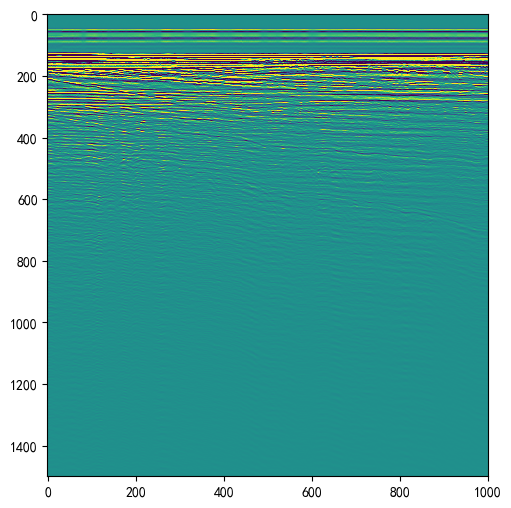

In [27]:
data = read_segy.read_segy(data_dir='./test.segy',shotnum=1)
data = data[0]
print(data.shape)
print(data.min())
print(data.max())

plt.figure(figsize=(10,6))
plt.imshow(data,aspect=0.7,vmin=-100,vmax=100)

In [3]:
model7m =  read_segy.read_segy(data_dir='F:/data/7m_shots_0201_0329.segy',shotnum=0)

start read segy data


(65, 1152, 3008)
-4.119355201721191
4.299093246459961


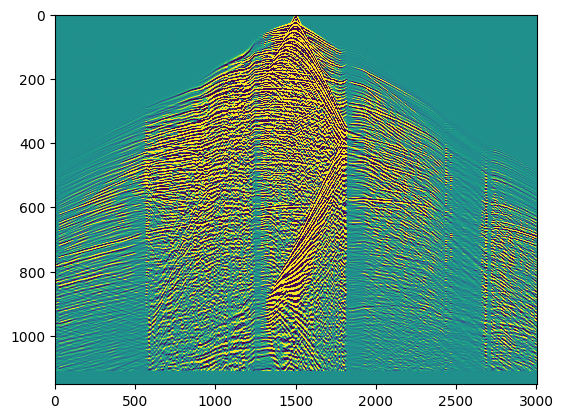

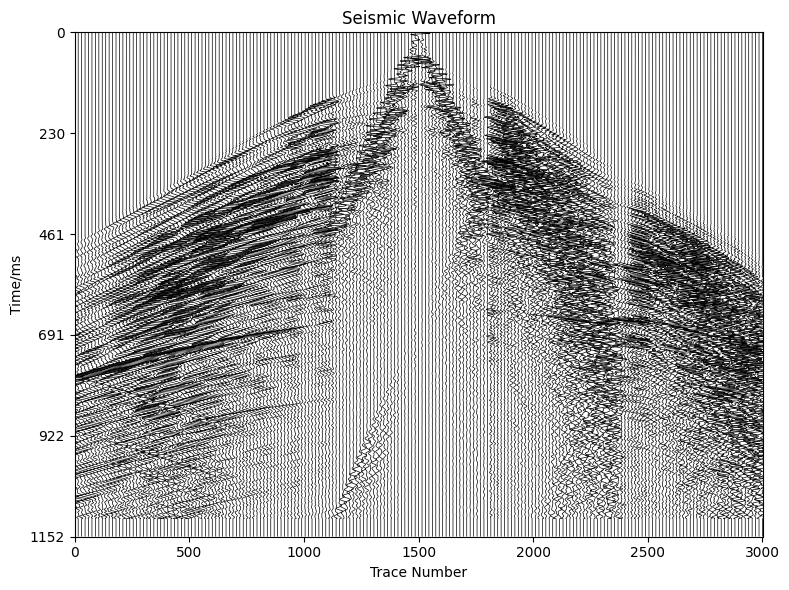

In [9]:
print(model7m.shape)
print(model7m.min())
print(model7m.max())
plt.imshow(model7m[56],vmin=-0.001,vmax=0.001,aspect=2)

# 使用示例
trace_spacing = 1    # 道间距
selected_traces = range(0, 3008, 15)  # 每隔10道选1道绘制

fig, ax = plt.subplots(figsize=(8, 6))
plot_wiggle(ax,  model7m[0], "Seismic Waveform", selected_traces, trace_spacing)
plt.tight_layout()
plt.show()

start read segy data


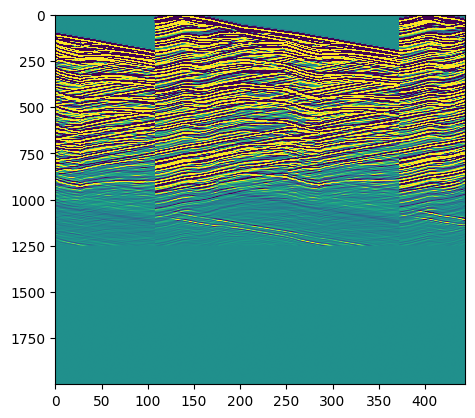

In [5]:
model94 =  read_segy.read_segy(data_dir='F:/data/Model94_shots.segy',shotnum=0) 
model94.shape #123600/240
model94.max()
model94.min()
plt.imshow(model94[2],vmin=-100,vmax=100,aspect=0.2)

In [10]:
model_vsp =  read_segy.read_segy(data_dir='F:/data/SEAM_I_Walkaway_VSP/SEAM_Well1VSP_Shots23900.sgy',shotnum=0)
print(model_vsp.shape)
print(model_vsp.min())
print(model_vsp.max())

start read segy data
(151, 2001, 1868)
-14897.015625
16801.90234375


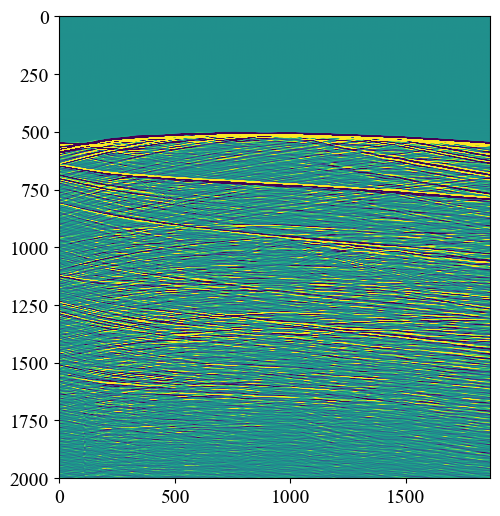

In [255]:
plt.figure(figsize=(10,6))
plt.imshow(model_vsp[0],vmin=-10,vmax=10,aspect=1)

start read segy data
(500, 1151, 800)
-328.9677734375
337.031982421875


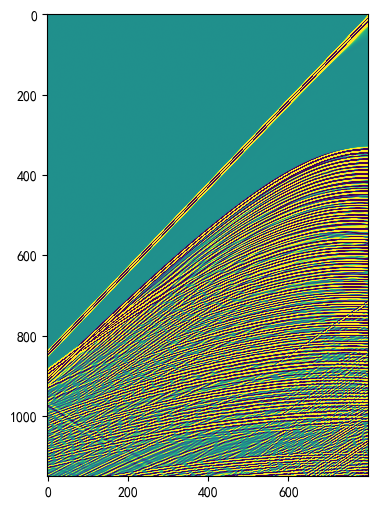

In [133]:
model_ani =  read_segy.read_segy(data_dir='F:/data/Anisotropic_FD_Model_Shots_part1.sgy',shotnum=0)

print(model_ani.shape)
print(model_ani.min())
print(model_ani.max())
plt.figure(figsize=(10,6))
plt.imshow(model_ani[20],vmin=-0.1,vmax=0.1,aspect=1)

## model_vsp

In [162]:
fb.shape

(1868,)

In [163]:
model_vsp.shape

(151, 2001, 1868)

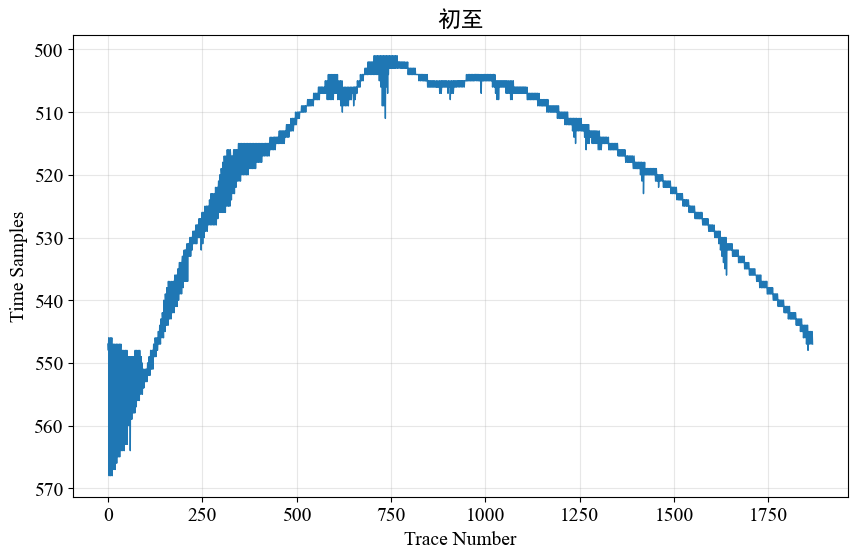

First Break shape = : (1868,)
First Break range = : 501 - 568


In [254]:
fb = calculate_fb(model_vsp[0],threshold=0.01)
plt.figure(figsize=(10, 6))
plt.plot(fb, linewidth=1)
plt.title('初至')
plt.xlabel('Trace Number')
plt.ylabel('Time Samples')
plt.gca().invert_yaxis()
plt.grid(True, alpha=0.3)
plt.show()

print(f"First Break shape = : {fb.shape}")
print(f"First Break range = : {np.min(fb)} - {np.max(fb)}")

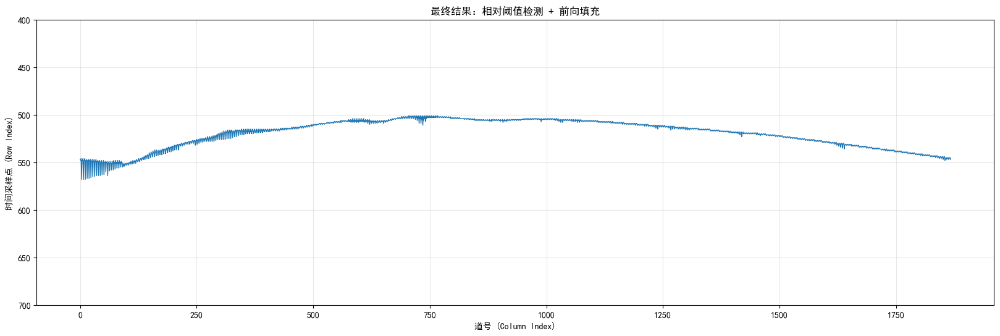

First Break shape = : (1868,)
First Break range = : 501 - 568


In [107]:
# 绘制最终结果
plt.figure(figsize=(20, 6))
plt.plot(fb, linewidth=1)
plt.title('最终结果：相对阈值检测 + 前向填充')
plt.xlabel('道号 (Column Index)')
plt.ylabel('时间采样点 (Row Index)')
plt.ylim(400,700)
plt.gca().invert_yaxis()
plt.grid(True, alpha=0.3)
plt.show()

print(f"First Break shape = : {fb.shape}")
print(f"First Break range = : {np.min(fb)} - {np.max(fb)}")

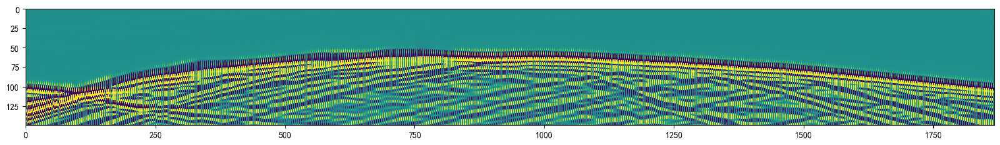

In [108]:
plt.figure(figsize=(20,15))
plt.imshow(model_vsp[0,450:600,:],vmin=-10,vmax=10,aspect=1.5)

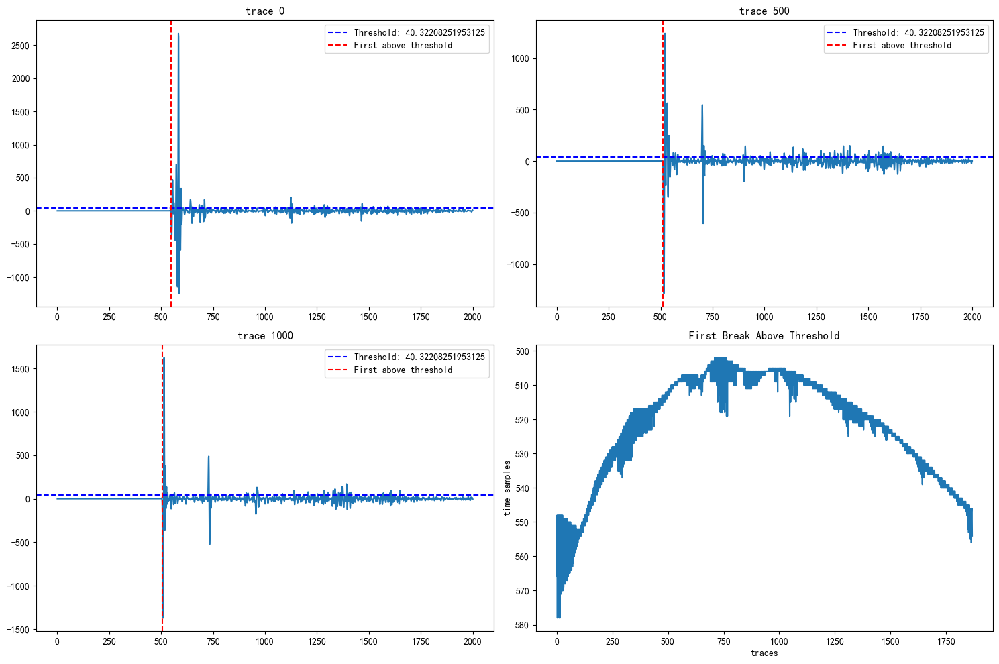

In [145]:
# 检查几列的结果
threshold = 0.01 * np.max(np.abs(model_vsp[0]))
plt.figure(figsize=(15, 10))

# 检查第0列
plt.subplot(2, 2, 1)
plt.plot(model_vsp[0, :, 0])
plt.axhline(y=threshold, color='b', linestyle='--', label=f'Threshold: {threshold}')
plt.axvline(x=fb[0], color='r', linestyle='--', label='First above threshold')
plt.title('trace 0')
plt.legend()

# 检查第500列
plt.subplot(2, 2, 2)
plt.plot(model_vsp[0, :, 500])
plt.axhline(y=threshold, color='b', linestyle='--', label=f'Threshold: {threshold}')
plt.axvline(x=fb[500], color='r', linestyle='--', label='First above threshold')
plt.title('trace 500')
plt.legend()

# 检查第1000列
plt.subplot(2, 2, 3)
plt.plot(model_vsp[0, :, 1000])
plt.axhline(y=threshold, color='b', linestyle='--', label=f'Threshold: {threshold}')
plt.axvline(x=fb[1000], color='r', linestyle='--', label='First above threshold')
plt.title('trace 1000')
plt.legend()

# 显示所有列的第一个点
plt.subplot(2, 2, 4)
plt.plot(fb)
plt.gca().invert_yaxis()
plt.title('First Break Above Threshold')
plt.xlabel('traces')
plt.ylabel('time samples')

plt.tight_layout()
plt.show()

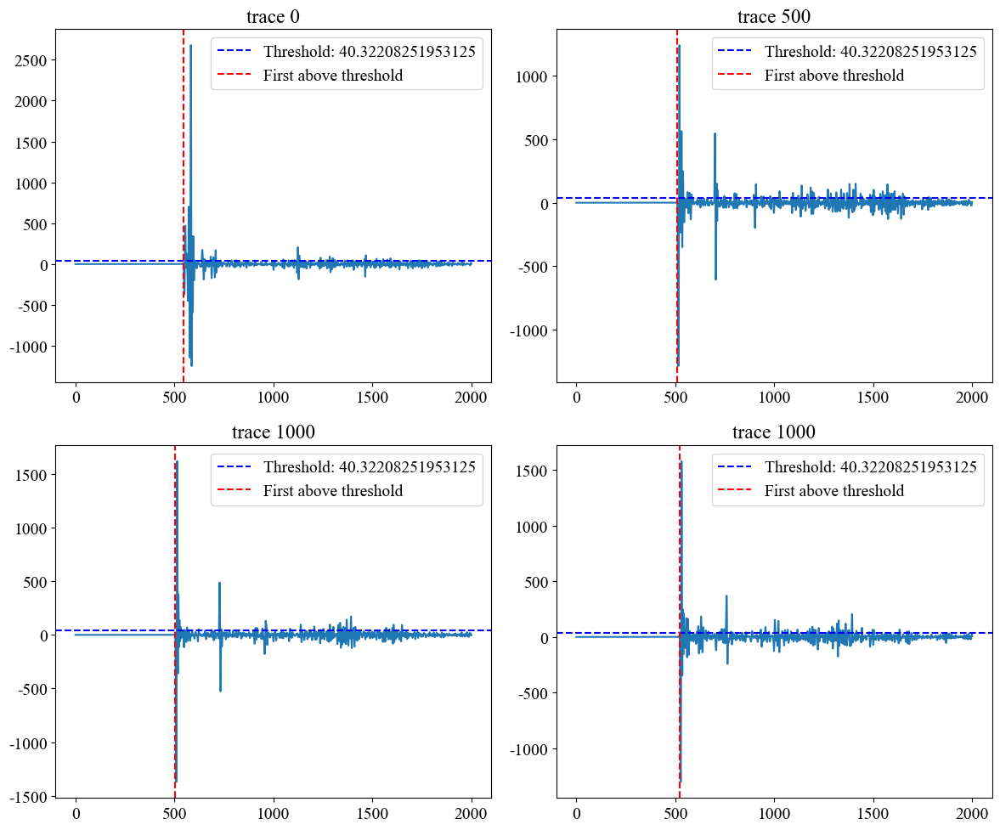

In [252]:
# 检查其中4道吧
threshold = 0.01 * np.max(np.abs(model_vsp[0]))
plt.figure(figsize=(12, 10))

# 检查第0道
plt.subplot(2, 2, 1)
plt.plot(model_vsp[0, :, 0])
plt.axhline(y=threshold, color='b', linestyle='--', label=f'Threshold: {threshold}')
plt.axvline(x=fb[0], color='r', linestyle='--', label='First above threshold')
plt.title('trace 0')
plt.legend()

# 检查第500道
plt.subplot(2, 2, 2)
plt.plot(model_vsp[0, :, 500])
plt.axhline(y=threshold, color='b', linestyle='--', label=f'Threshold: {threshold}')
plt.axvline(x=fb[500], color='r', linestyle='--', label='First above threshold')
plt.title('trace 500')
plt.legend()

# 检查第1000道
plt.subplot(2, 2, 3)
plt.plot(model_vsp[0, :, 1000])
plt.axhline(y=threshold, color='b', linestyle='--', label=f'Threshold: {threshold}')
plt.axvline(x=fb[1000], color='r', linestyle='--', label='First above threshold')
plt.title('trace 1000')
plt.legend()

# 检查第1500道
plt.subplot(2, 2, 4)
plt.plot(model_vsp[0, :, 1500])
plt.axhline(y=threshold, color='b', linestyle='--', label=f'Threshold: {threshold}')
plt.axvline(x=fb[1500], color='r', linestyle='--', label='First above threshold')
plt.title('trace 1000')
plt.legend()

plt.rcParams['font.size'] = 14
plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


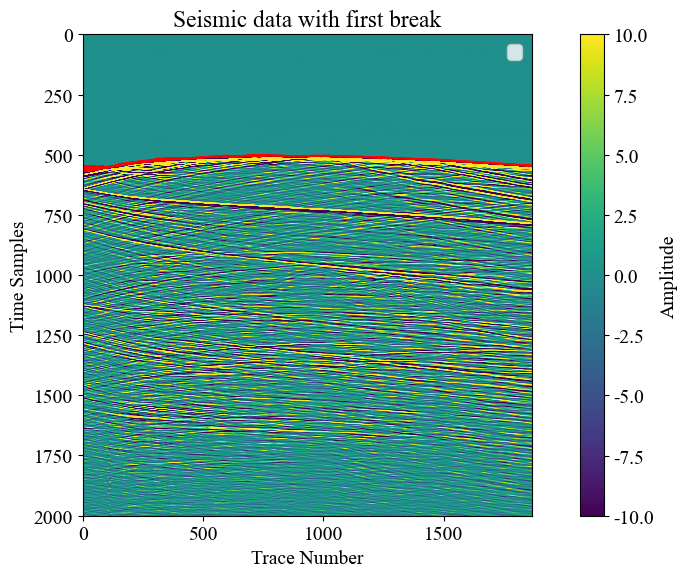

In [ ]:
plt.figure(figsize=(10, 6))  

# 绘制地震剖面
img = plt.imshow(model_vsp[0], aspect=1, vmin=-10, vmax=10)
plt.colorbar(label='Amplitude')

# 绘制初至
x = np.arange(model_vsp[0].shape[1])  
plt.plot(x,fb, 'r-', linewidth=1.5)

plt.xlabel('Trace Number')
plt.ylabel('Time Samples')
plt.title('Seismic data with first break')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
shots, times, traces = model_vsp.shape
fb_all = np.zeros((shots, traces), dtype=int)

for i in range(shots):
    current_shot = model_vsp[i, :, :]
    fb_all[i, :] = calculate_fb(current_shot, threshold=0.05)

print(f"fb_all shape: {fb_all.shape}") 

fb_all shape: (151, 1868)


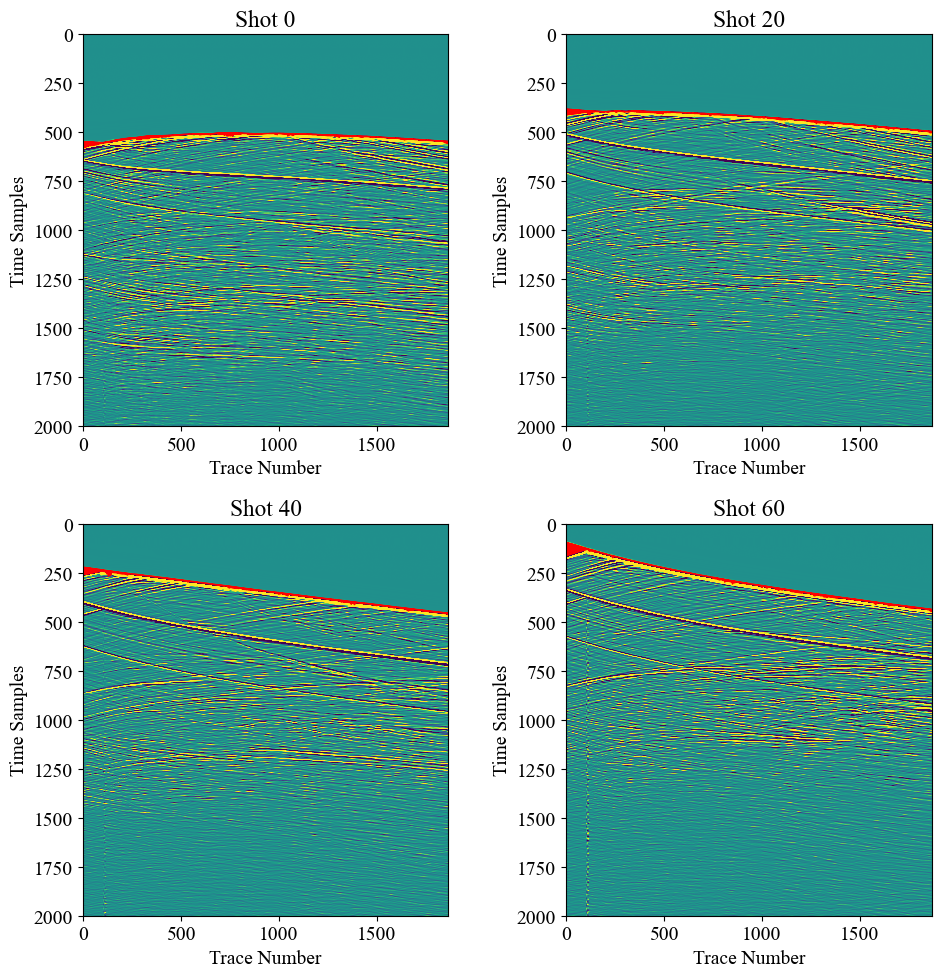

In [256]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()

model_vsp_list = [model_vsp[0], model_vsp[20], model_vsp[40], model_vsp[60]] 
fb_list = [fb_all[0], fb_all[20], fb_all[40], fb_all[60]] 
titles = ['Shot 0', 'Shot 20', 'Shot 40', 'Shot 60'] 

for i in range(4):
    img = axes[i].imshow(model_vsp_list[i], aspect=1, vmin=-10, vmax=10)
    x = np.arange(model_vsp_list[i].shape[1])
    axes[i].plot(x, fb_list[i], 'r-', linewidth=1.0)
    
    axes[i].set_xlabel('Trace Number')
    axes[i].set_ylabel('Time Samples')
    axes[i].set_title(f'{titles[i]}')

plt.tight_layout()
plt.show()

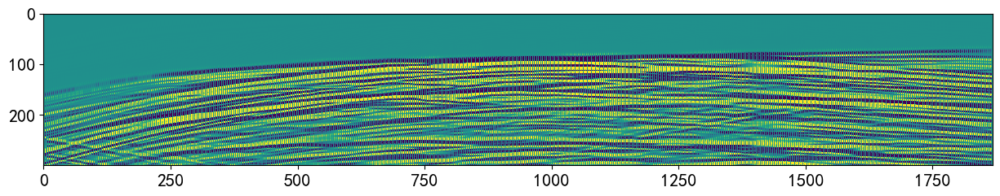

In [215]:
plt.figure(figsize=(15,10))
plt.imshow(model_vsp[150,400:700,:],vmin=-10,vmax=10)

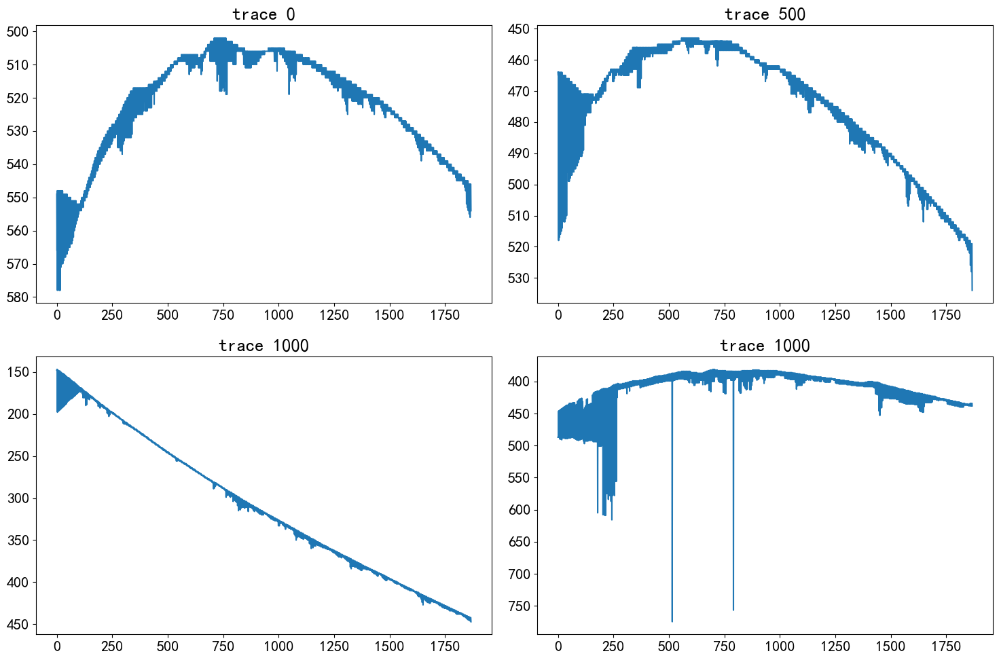

In [195]:
plt.figure(figsize=(15, 10))

# 检查第0炮
plt.subplot(2, 2, 1)
plt.plot(fb_all[0])
plt.gca().invert_yaxis()
plt.title('trace 0')

# 检查第10炮
plt.subplot(2, 2, 2)
plt.plot(fb_all[10])
plt.gca().invert_yaxis()
plt.title('trace 500')


# 检查第50炮
plt.subplot(2, 2, 3)
plt.plot(fb_all[50])
plt.gca().invert_yaxis()
plt.title('trace 1000')


# 检查第100炮
plt.subplot(2, 2, 4)
plt.plot(fb_all[120])
plt.gca().invert_yaxis()
plt.title('trace 1000')


plt.tight_layout()
plt.show()

C:\Users\Cocklebur77\AppData\Local\Temp\ipykernel_25124\1091137589.py:25: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


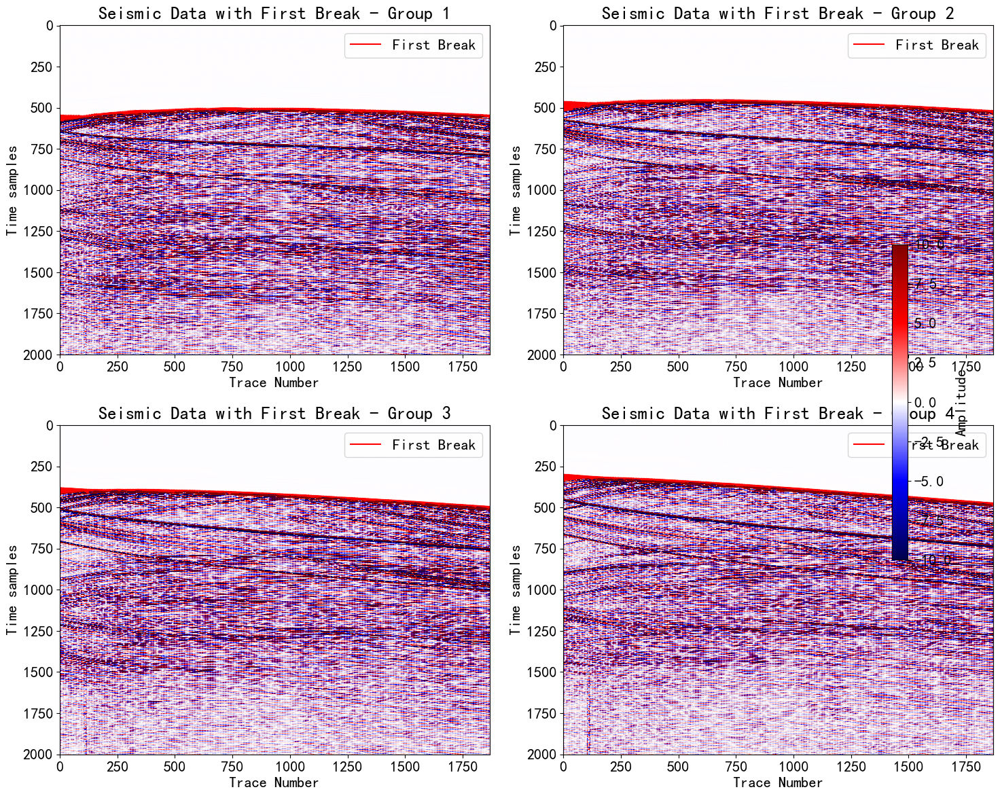

In [182]:
# 创建4个子图
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

# 找到全局的最大最小值用于统一的colorbar
vmin, vmax = -10, 10  # 或者根据数据动态计算
# vmin, vmax = np.min(model_vsp[:4]), np.max(model_vsp[:4])

for i in range(4):
    # 绘制地震剖面
    img = axes[i].imshow(model_vsp[i*10], aspect='auto', vmin=vmin, vmax=vmax, cmap='seismic')
    
    # 绘制初至曲线
    x = np.arange(model_vsp[i*10].shape[1])
    axes[i].plot(x, fb_all[i*10], 'r-', linewidth=1.5, label='First Break')
    
    axes[i].set_xlabel('Trace Number')
    axes[i].set_ylabel('Time samples')
    axes[i].set_title(f'Seismic Data with First Break - Group {i+1}')
    axes[i].legend()

# 添加一个共享的colorbar
fig.colorbar(img, ax=axes, orientation='vertical', fraction=0.02, pad=0.04, label='Amplitude')

plt.tight_layout()
plt.show()

## model7m

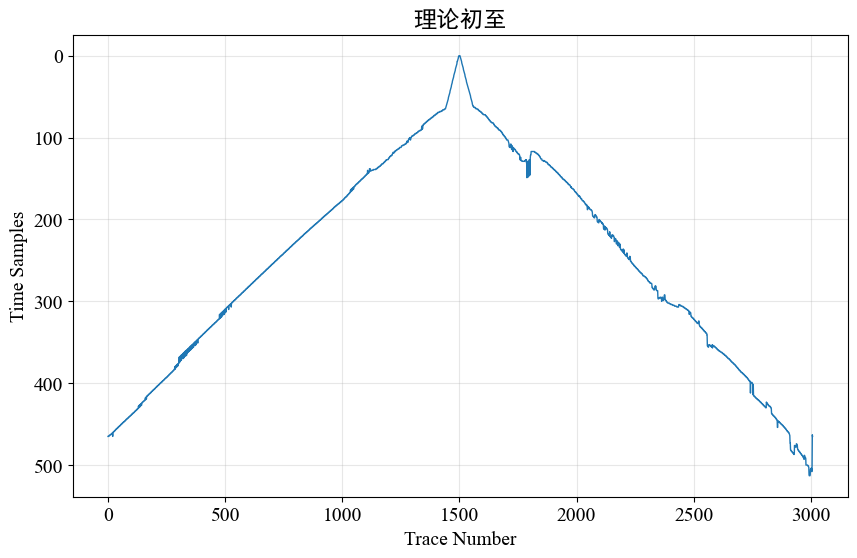

First Break shape = : (3008,)
First Break range = : 0 - 513


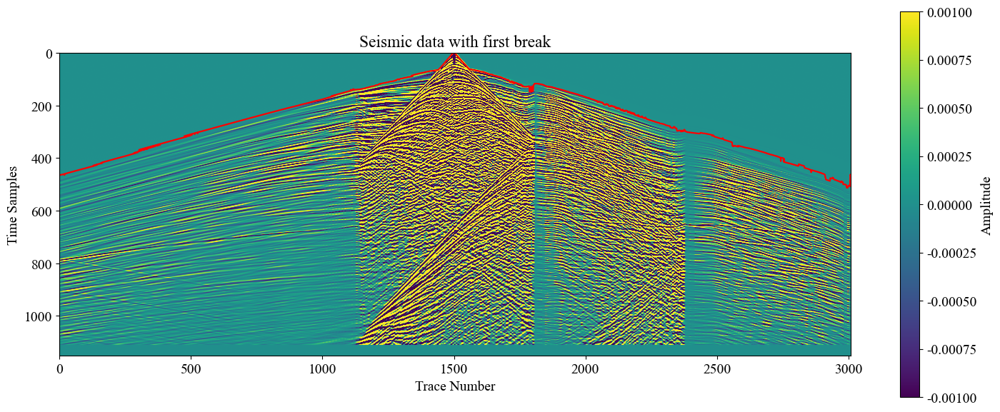

In [264]:
fb = calculate_fb(model7m[0],threshold=0.005)


# 绘制最终结果
plt.figure(figsize=(10, 6))
plt.plot(fb, linewidth=1)
plt.title('理论初至')
plt.xlabel('Trace Number')
plt.ylabel('Time Samples')
plt.gca().invert_yaxis()
plt.grid(True, alpha=0.3)
plt.show()

print(f"First Break shape = : {fb.shape}")
print(f"First Break range = : {np.min(fb)} - {np.max(fb)}")

#绘制地震单炮和初至的叠合显示
plt.figure(figsize=(15, 6))  
img = plt.imshow(model7m[0,:,:], aspect=1, vmin=-0.001, vmax=0.001)
plt.colorbar(label='Amplitude')

x = np.arange(model7m[0].shape[1])  # 道号(0-600)
plt.plot(x,fb, 'r-', linewidth=1.5)

# 添加标签和标题
plt.xlabel('Trace Number')
plt.ylabel('Time Samples')
plt.title('Seismic data with first break')

plt.tight_layout()
plt.show()

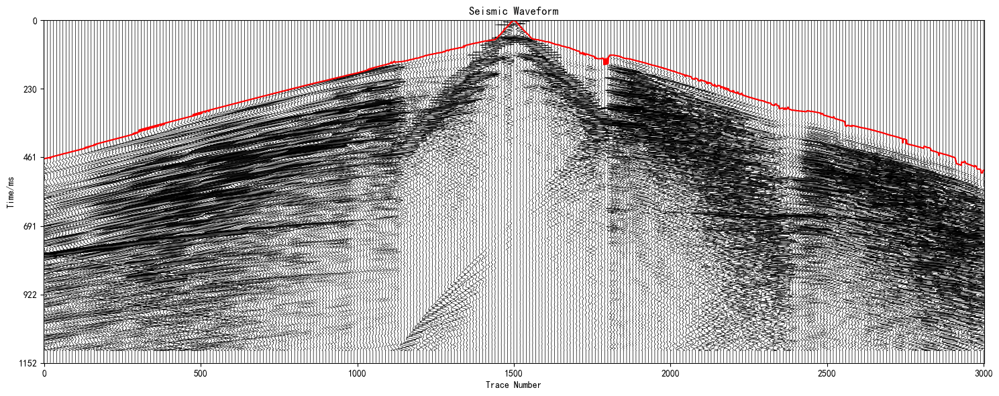

In [130]:
# 使用示例
trace_spacing = 1    # 道间距
selected_traces = range(0, 3008, 10)  # 每隔10道选1道绘制

fig, ax = plt.subplots(figsize=(15, 6))
plot_wiggle(ax,  model7m[0], "Seismic Waveform", selected_traces, trace_spacing)


x = np.arange(model7m[0].shape[1])  # 道号(0-600)
plt.plot(x,fb, 'r-', linewidth=1.5)

plt.tight_layout()
plt.show()

## model_ani

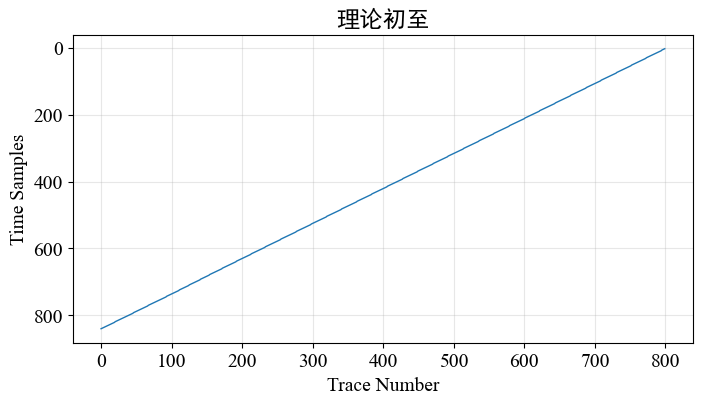

First Break shape = : (800,)
First Break range = : 3 - 840


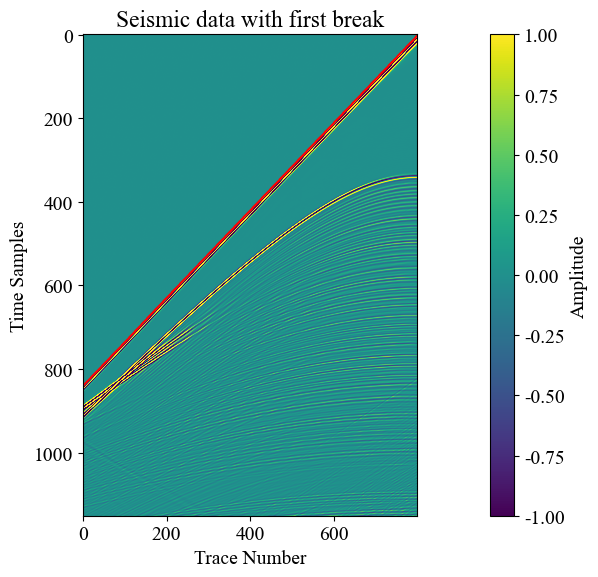

In [275]:
fb = calculate_fb(model_ani[0],threshold=0.01)

plt.figure(figsize=(8, 4))
plt.plot(fb, linewidth=1)
plt.title('理论初至')
plt.xlabel('Trace Number')
plt.ylabel('Time Samples')
plt.gca().invert_yaxis()
plt.grid(True, alpha=0.3)
plt.show()

print(f"First Break shape = : {fb.shape}")
print(f"First Break range = : {np.min(fb)} - {np.max(fb)}")

#绘制地震单炮和初至的叠合显示
plt.figure(figsize=(15, 6))  
img = plt.imshow(model_ani[0], aspect=1, vmin=-1, vmax=1)
plt.colorbar(label='Amplitude')

x = np.arange(model_ani[0].shape[1])  
plt.plot(x,fb, 'r-', linewidth=1.5)

plt.xlabel('Trace Number')
plt.ylabel('Time Samples')
plt.title('Seismic data with first break')

plt.tight_layout()
plt.show()

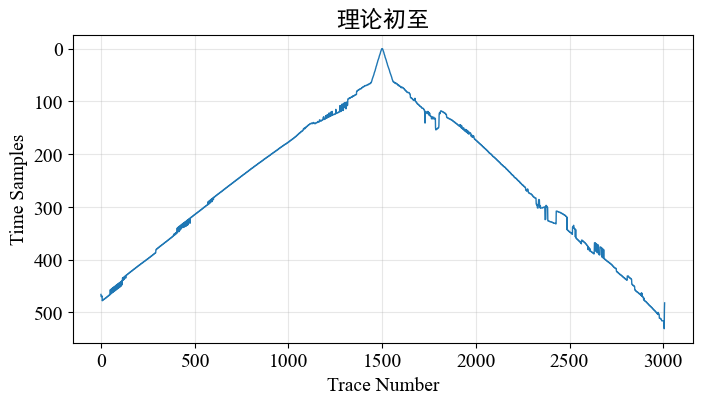

First Break shape = : (3008,)
First Break range = : 0 - 531


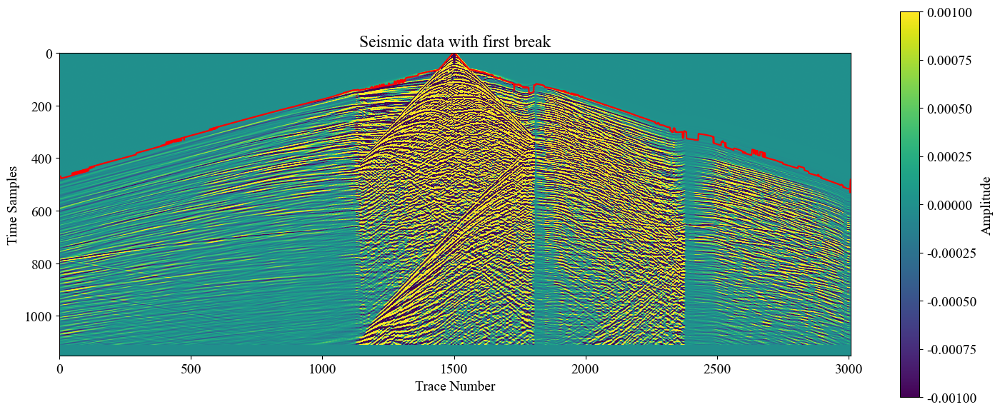

In [276]:
fb = calculate_fb(model7m[0],threshold=0.01)

plt.figure(figsize=(8, 4))
plt.plot(fb, linewidth=1)
plt.title('理论初至')
plt.xlabel('Trace Number')
plt.ylabel('Time Samples')
plt.gca().invert_yaxis()
plt.grid(True, alpha=0.3)
plt.show()

print(f"First Break shape = : {fb.shape}")
print(f"First Break range = : {np.min(fb)} - {np.max(fb)}")

#绘制地震单炮和初至的叠合显示
plt.figure(figsize=(15, 6))  
img = plt.imshow(model7m[0], aspect=1, vmin=-0.001, vmax=0.001)
plt.colorbar(label='Amplitude')

x = np.arange(model7m[0].shape[1])  
plt.plot(x,fb, 'r-', linewidth=1.5)

plt.xlabel('Trace Number')
plt.ylabel('Time Samples')
plt.title('Seismic data with first break')

plt.tight_layout()
plt.show()